In [1]:
import pandas as pd
import geopandas as gpd
import contextily as ctx
import matplotlib.pyplot as plt
import osmnx as ox
import networkx as nx

In [109]:
race = gpd.read_file('Data/Census_Data/raceethnicity.geojson')

In [110]:
race = race.drop([0])

In [111]:
columns_to_keep = ['geoid',
 'name',
 'B03002001',
 'B03002004',
 'B03002006',
 'B03002012',
 'geometry']

In [112]:
race = race[columns_to_keep]

In [113]:
race.columns = ['geoid',
 'name',
 'Total',
 'Non Hispanic Black',
 'Non Hispanic Asian',
 'Hispanic',
 'geometry']

In [114]:
race['Percent Non Hispanic Black'] = race['Non Hispanic Black']/race['Total']*100
race['Percent Non Hispanic Asian'] = race['Non Hispanic Asian']/race['Total']*100
race['Percent Hispanic'] = race['Hispanic']/race['Total']*100

In [115]:
race.head()

,geoid,name,Total,Non Hispanic Black,Non Hispanic Asian,Hispanic,geometry,Percent Non Hispanic Black,Percent Non Hispanic Asian,Percent Hispanic
1,14000US06037101110,"Census Tract 1011.10, Los Angeles, CA",4283.0,19.0,331.0,1188.0,"MULTIPOLYGON (((-118.30229 34.25870, -118.3009...",0.443614,7.728228,27.737567
2,14000US06037101122,"Census Tract 1011.22, Los Angeles, CA",3405.0,74.0,220.0,147.0,"MULTIPOLYGON (((-118.30334 34.27371, -118.3033...",2.173275,6.461087,4.317181
3,14000US06037101210,"Census Tract 1012.10, Los Angeles, CA",6347.0,198.0,486.0,2616.0,"MULTIPOLYGON (((-118.29945 34.25598, -118.2979...",3.119584,7.657161,41.216323
4,14000US06037101220,"Census Tract 1012.20, Los Angeles, CA",3702.0,87.0,341.0,1364.0,"MULTIPOLYGON (((-118.28593 34.25227, -118.2859...",2.350081,9.211237,36.844949
5,14000US06037101300,"Census Tract 1013, Los Angeles, CA",3884.0,205.0,194.0,297.0,"MULTIPOLYGON (((-118.27822 34.25068, -118.2782...",5.278064,4.994851,7.646756


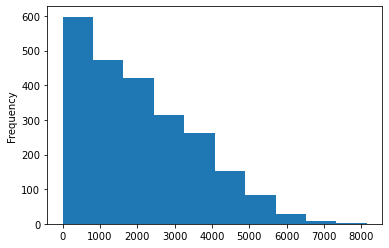

In [116]:
race['Hispanic'].plot.hist(bins=10)

Text(0.5, 1.0, 'Percent Non Latinx Black People')

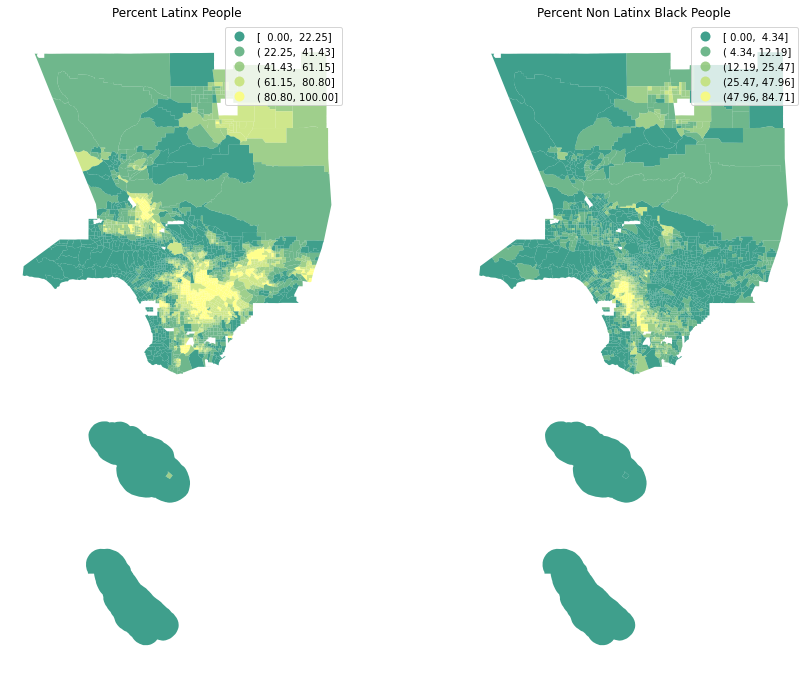

In [117]:
fig, axs = plt.subplots(1, 2, figsize=(15, 12))
ax1, ax2 = axs
race.plot(column='Percent Hispanic', 
            cmap='summer', 
            scheme='NaturalBreaks',
            k=5, 
            edgecolor='white', 
            linewidth=0., 
            alpha=0.75, 
            ax=ax1, 
            legend=True
           )
ax1.axis("off")
ax1.set_title("Percent Latinx People")

race.plot(column='Percent Non Hispanic Black', 
            cmap='summer', 
            scheme='NaturalBreaks',
            k=5, 
            linewidth=0., 
            alpha=0.75, 
            ax=ax2, 
            legend=True
           )
ax2.axis("off")
ax2.set_title("Percent Non Latinx Black People")



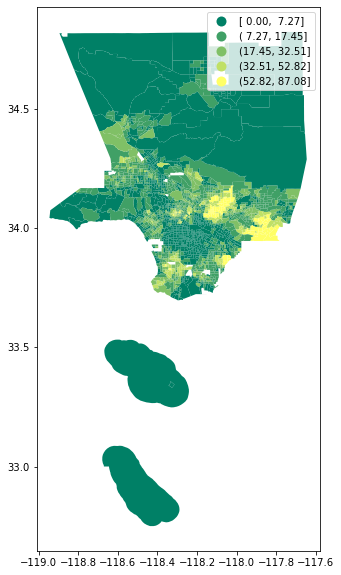

In [118]:
race.plot(figsize=(12,10),
                 column='Percent Non Hispanic Asian',
                 legend=True, 
                 cmap='summer',
                 scheme='NaturalBreaks')

In [119]:
race_web_mercator = race.to_crs(epsg=3857)

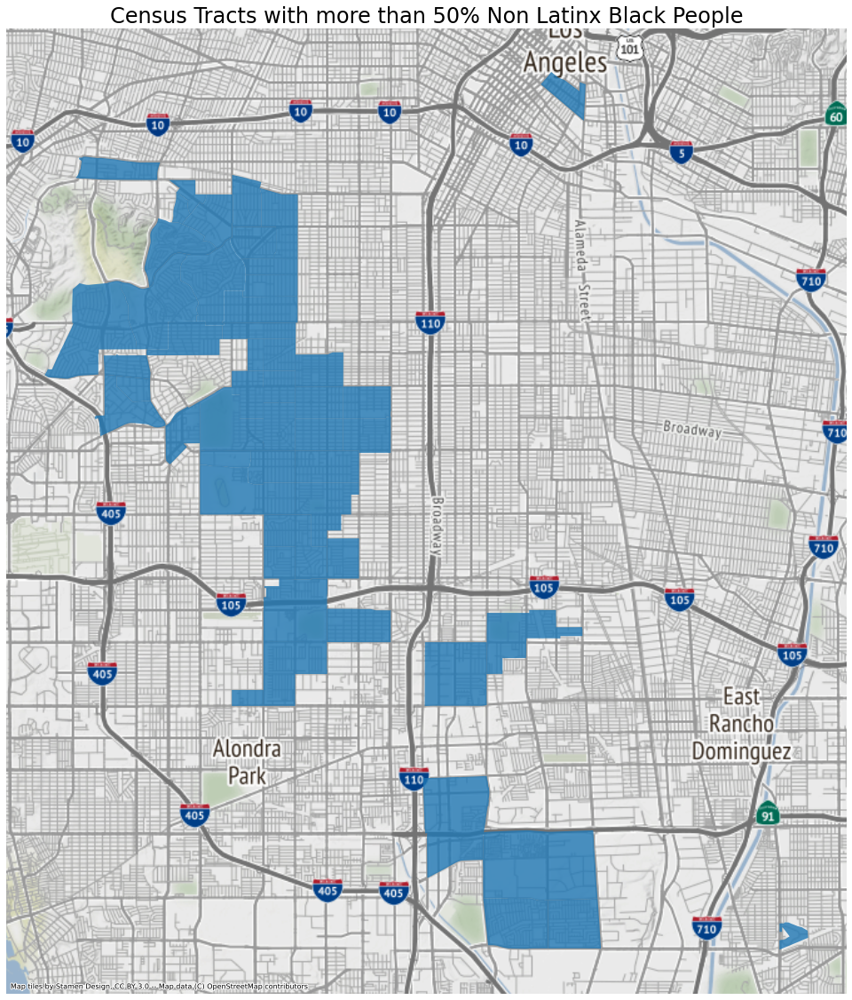

In [120]:
fig, ax = plt.subplots(figsize=(20, 20))
race_web_mercator[race_web_mercator['Percent Non Hispanic Black'] > 50].plot(ax=ax, alpha=0.8)
ax.axis('off')
ax.set_title('Census Tracts with more than 50% Non Latinx Black People',fontsize=24)
ctx.add_basemap(ax)

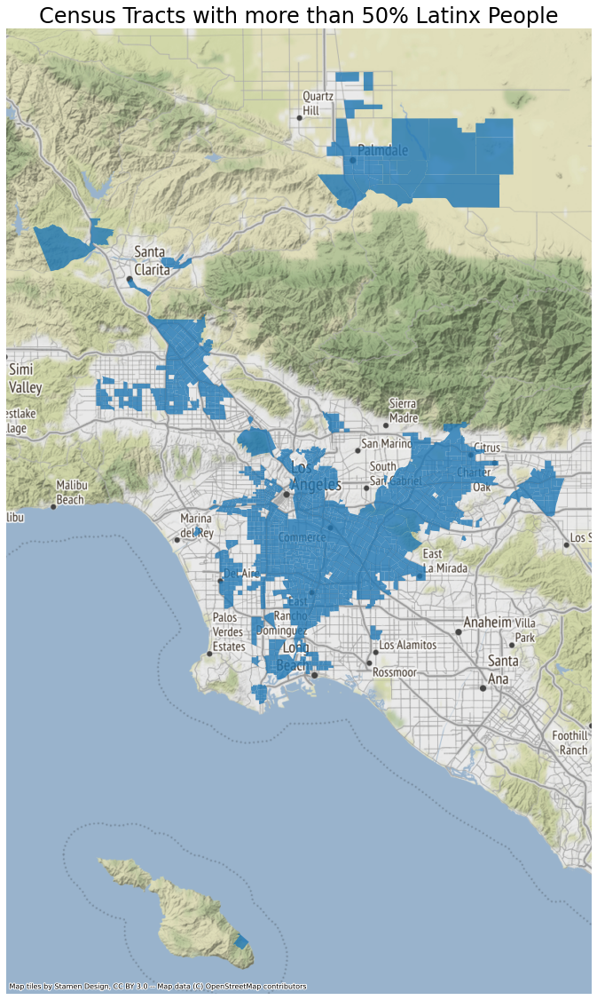

In [121]:
fig, ax = plt.subplots(figsize=(20, 20))
race_web_mercator[race_web_mercator['Percent Hispanic'] > 50].plot(ax=ax, alpha=0.8)
ax.axis('off')
ax.set_title('Census Tracts with more than 50% Latinx People',fontsize=24)
ctx.add_basemap(ax)

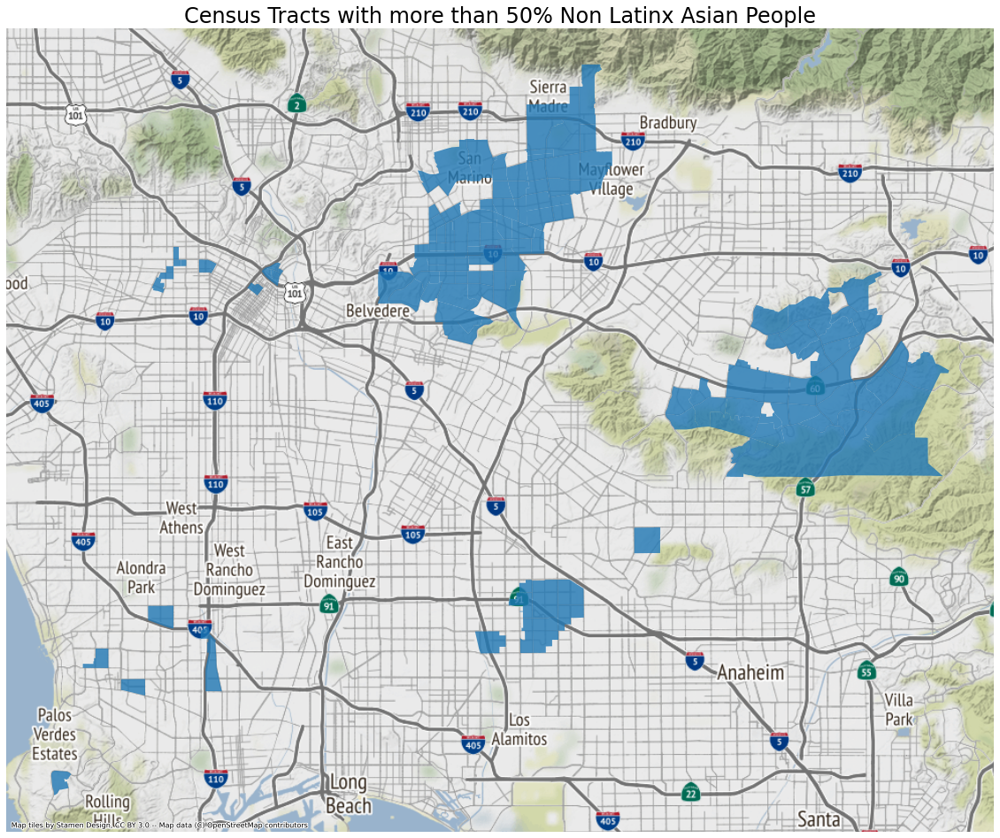

In [122]:
fig, ax = plt.subplots(figsize=(20, 20))
race_web_mercator[race_web_mercator['Percent Non Hispanic Asian'] > 50].plot(ax=ax, alpha=0.8)
ax.axis('off')
ax.set_title('Census Tracts with more than 50% Non Latinx Asian People',fontsize=24)
ctx.add_basemap(ax)

In [123]:
foreign = gpd.read_file('Data/Census_Data/foreignborn.geojson')

In [132]:
foreign = foreign.drop([0])

In [124]:
columns_to_keep = ['geoid',
 'name',
 'B05012001',
 'B05012002',
 'B05012003',
 'geometry']

In [125]:
foreign = foreign[columns_to_keep]

In [126]:
foreign.columns = ['geoid',
 'name',
 'Total',
 'Native Born',
 'Foreign Born',
 'geometry']

In [127]:
foreign['Percent Native Born'] = foreign['Native Born']/foreign['Total']*100
foreign['Percent Foreign Born'] = foreign['Foreign Born']/foreign['Total']*100


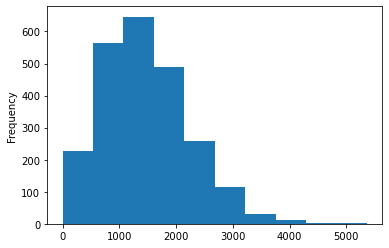

In [134]:
foreign['Foreign Born'].plot.hist(bins=10)

In [129]:
foreign_web_mercator = foreign.to_crs(epsg=3857)

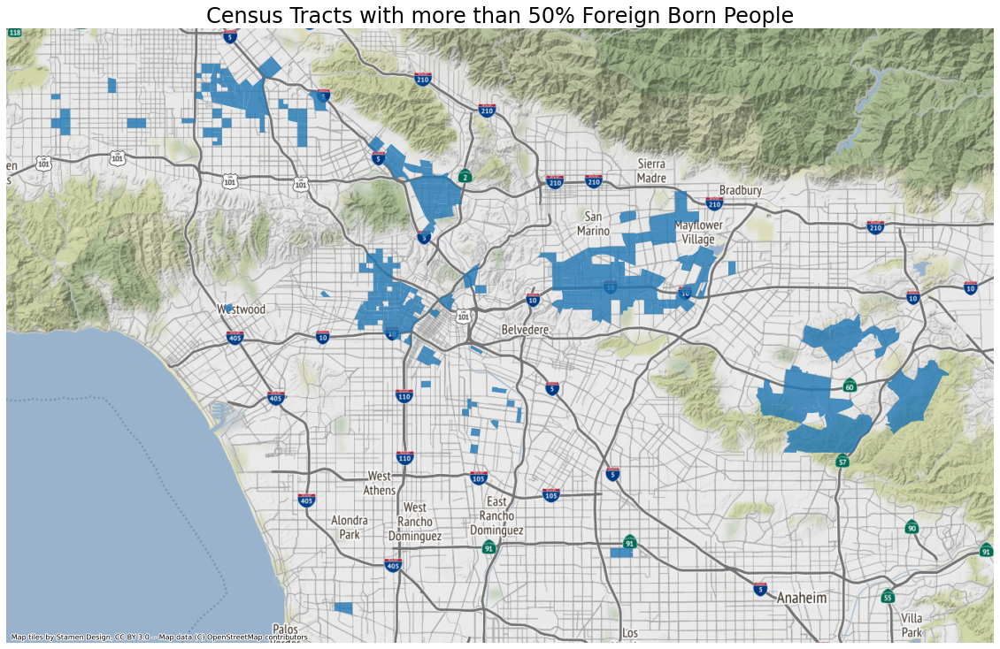

In [137]:
fig, ax = plt.subplots(figsize=(20, 20))
foreign_web_mercator[foreign_web_mercator['Percent Foreign Born'] > 50].plot(ax=ax, alpha=0.8)
ax.axis('off')
ax.set_title('Census Tracts with more than 50% Foreign Born People',fontsize=24)
ctx.add_basemap(ax)

Text(0.5, 1.0, 'Percent Foreign Born People')

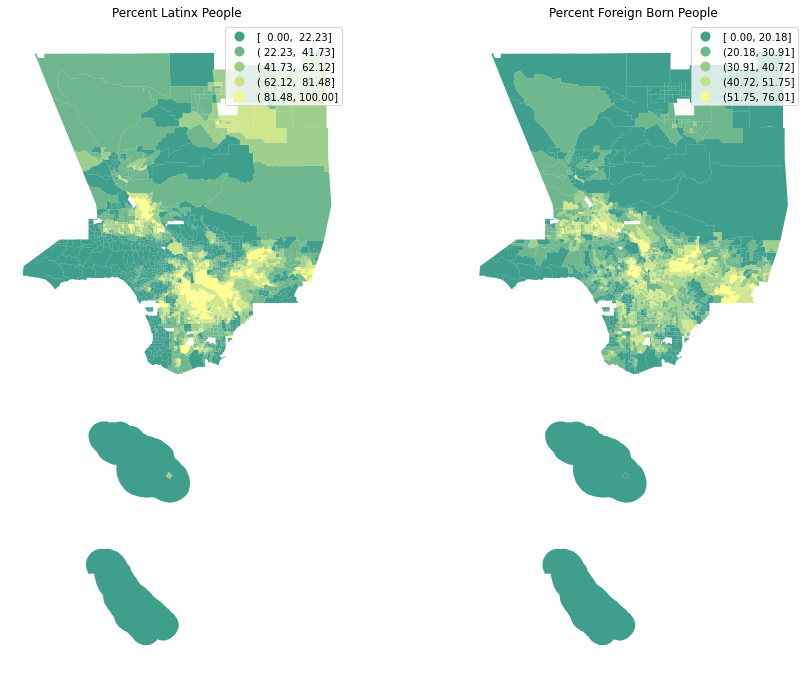

In [138]:
fig, axs = plt.subplots(1, 2, figsize=(15, 12))
ax1, ax2 = axs
race.plot(column='Percent Hispanic', 
            cmap='summer', 
            scheme='NaturalBreaks',
            k=5, 
            edgecolor='white', 
            linewidth=0., 
            alpha=0.75, 
            ax=ax1, 
            legend=True
           )
ax1.axis("off")
ax1.set_title("Percent Latinx People")

foreign.plot(column='Percent Foreign Born', 
            cmap='summer', 
            scheme='NaturalBreaks',
            k=5, 
            linewidth=0., 
            alpha=0.75, 
            ax=ax2, 
            legend=True
           )
ax2.axis("off")
ax2.set_title("Percent Foreign Born People")

Text(0.5, 1.0, 'Percent Foreign Born People')

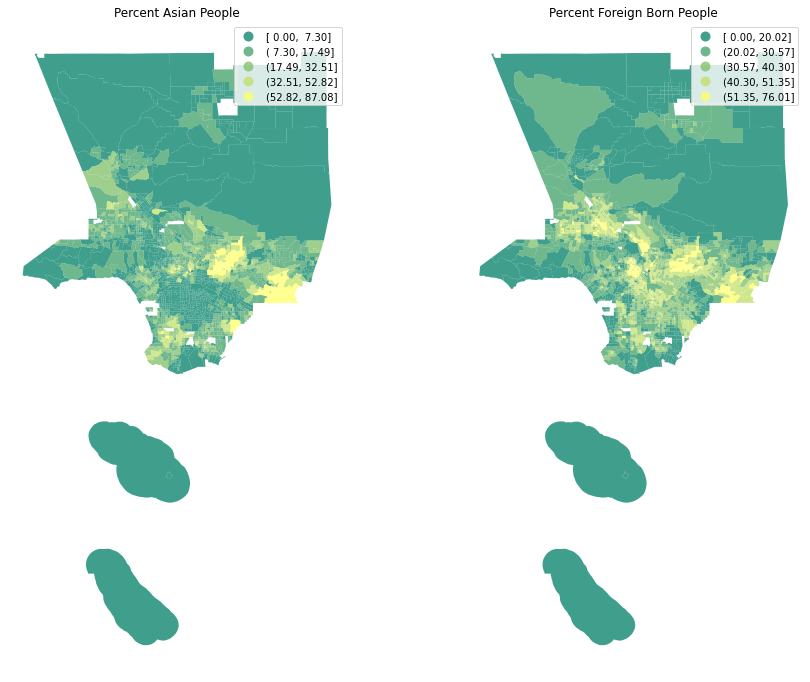

In [139]:
fig, axs = plt.subplots(1, 2, figsize=(15, 12))
ax1, ax2 = axs
race.plot(column='Percent Non Hispanic Asian', 
            cmap='summer', 
            scheme='NaturalBreaks',
            k=5, 
            edgecolor='white', 
            linewidth=0., 
            alpha=0.75, 
            ax=ax1, 
            legend=True
           )
ax1.axis("off")
ax1.set_title("Percent Asian People")

foreign.plot(column='Percent Foreign Born', 
            cmap='summer', 
            scheme='NaturalBreaks',
            k=5, 
            linewidth=0., 
            alpha=0.75, 
            ax=ax2, 
            legend=True
           )
ax2.axis("off")
ax2.set_title("Percent Foreign Born People")

In [140]:
car = gpd.read_file('Data/Census_Data/carownership.geojson')

In [142]:
car = car.drop([0])

In [143]:
columns_to_keep = ['geoid',
 'name',
 'B08301001',
 'B08301002',
 'geometry']

In [144]:
car = car[columns_to_keep]

In [146]:
car.columns = ['geoid',
 'name',
 'Total',
 'Automobile',
 'geometry']

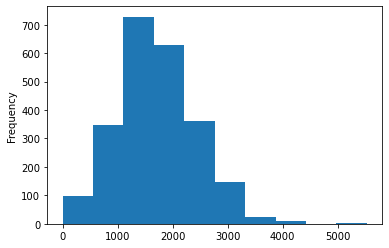

In [148]:
car['Automobile'].plot.hist(bins=10)

In [149]:
car['Percent Automobile'] = car['Automobile']/car['Total']*100

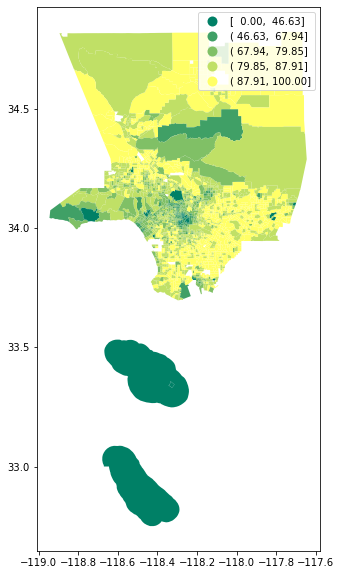

In [150]:
car.plot(figsize=(12,10),
                 column='Percent Automobile',
                 legend=True, 
                 cmap='summer',
                 scheme='NaturalBreaks')

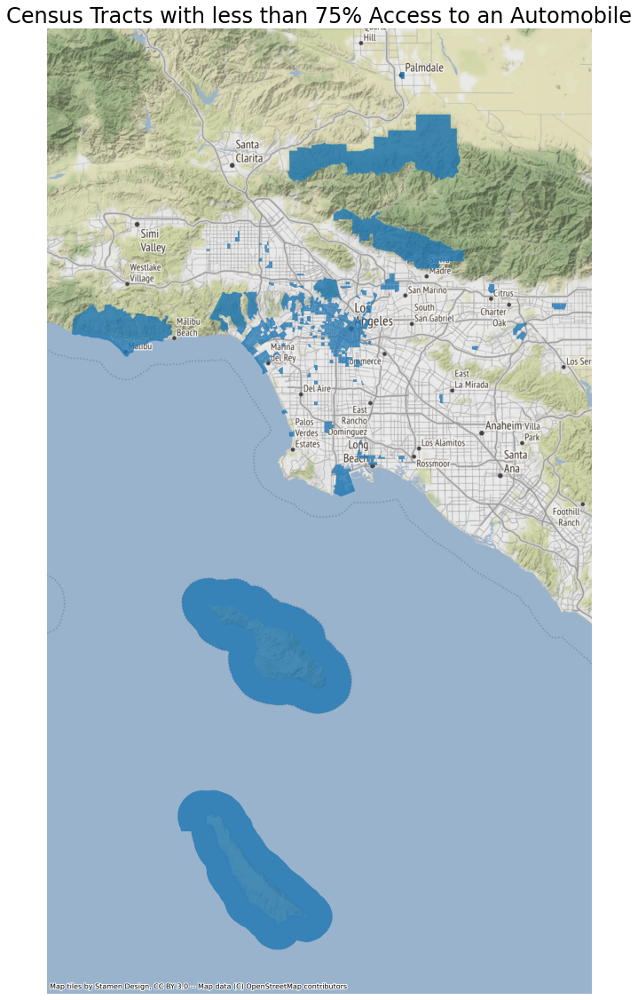

In [151]:
car_web_mercator = car.to_crs(epsg=3857)
fig, ax = plt.subplots(figsize=(20, 20))
car_web_mercator[car_web_mercator['Percent Automobile'] < 75].plot(ax=ax, alpha=0.8)
ax.axis('off')
ax.set_title('Census Tracts with less than 75% Access to an Automobile',fontsize=24)
ctx.add_basemap(ax)

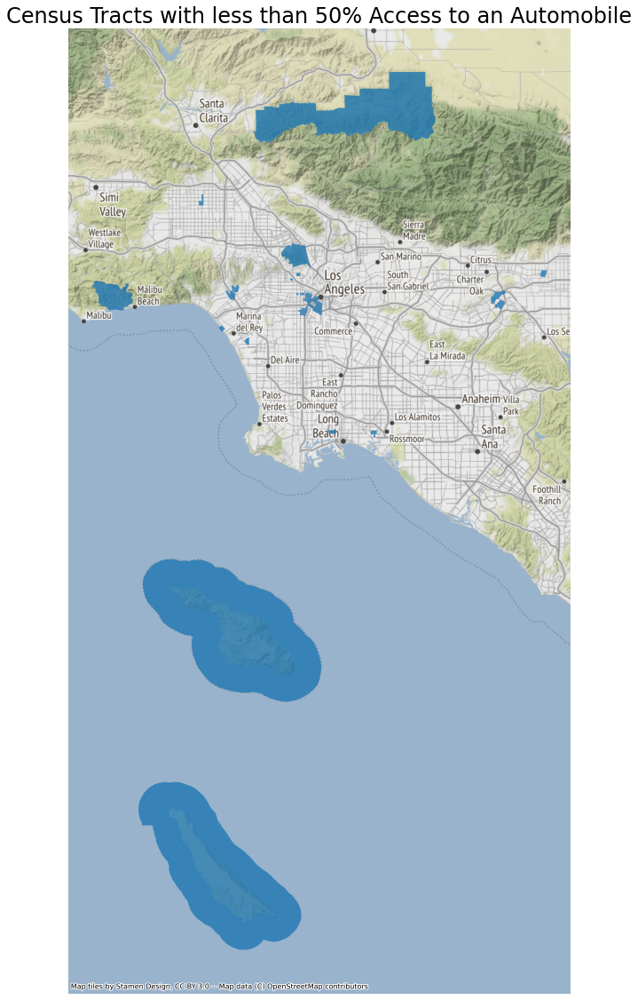

In [153]:
car_web_mercator = car.to_crs(epsg=3857)
fig, ax = plt.subplots(figsize=(20, 20))
car_web_mercator[car_web_mercator['Percent Automobile'] < 50].plot(ax=ax, alpha=0.8)
ax.axis('off')
ax.set_title('Census Tracts with less than 50% Access to an Automobile',fontsize=24)
ctx.add_basemap(ax)

In [29]:
LA = gpd.read_file('Data/RapidBRT/BusStop.geojson')

In [31]:
LA.head()

,STOPNUM,STOPNAME,LAT,LONG,LINE_DIR_1,LINE_DIR_2,LINE_DIR_3,LINE_DIR_4,LINE_DIR_5,LINE_DIR_6,...,LINE_DIR_A,LINE_DIR_B,LINE_DIR_C,LINE_DIR_D,LINE_DIR_E,LINE_DIR_F,LINE_DIR_G,LINE_DIR_H,LINE_DIR_I,geometry
0,1,PARAMOUNT / SLAUSON,33.973248,-118.113113,108-E,265-S,None,None,None,None,...,None,None,None,None,None,None,None,None,None,POINT (-118.11311 33.97325)
1,3,JEFFERSON / 10TH,34.025471,-118.328402,35-N,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,POINT (-118.32840 34.02547)
2,6,120TH \ AUGUSTUS F HAWKINS,33.924696,-118.242222,55-N,120-W,None,None,None,None,...,None,None,None,None,None,None,None,None,None,POINT (-118.24222 33.92470)
3,7,120TH \ MARTIN LUTHER KING HOSPITAL,33.924505,-118.240369,55-S,120-E,None,None,None,None,...,None,None,None,None,None,None,None,None,None,POINT (-118.24037 33.92451)
4,8,120TH / CRENSHAW,33.923818,-118.326886,126-E,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,POINT (-118.32689 33.92382)


In [32]:

#if you want to test out that everything is working ok before you run the function for the whole gdf, make a smaller gdf
#in this example, I created a gdf called 'test' that only includes stops on the Capitol Ave BRT route.
test = LA.loc[LA['LINE_DIR_1'] == '910-S']

In [33]:
test.head()

,STOPNUM,STOPNAME,LAT,LONG,LINE_DIR_1,LINE_DIR_2,LINE_DIR_3,LINE_DIR_4,LINE_DIR_5,LINE_DIR_6,...,LINE_DIR_A,LINE_DIR_B,LINE_DIR_C,LINE_DIR_D,LINE_DIR_E,LINE_DIR_F,LINE_DIR_G,LINE_DIR_H,LINE_DIR_I,geometry
308,378,HARBOR BEACON PARK RIDE - SB,33.746895,-118.280473,910-S,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,POINT (-118.28047 33.74690)
1825,2603,BEACON / 1ST,33.743430,-118.280511,910-S,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,POINT (-118.28051 33.74343)
9589,14073,HARBOR FWY \ CARSON,33.831269,-118.287584,910-S,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,POINT (-118.28758 33.83127)
13431,142216,HARBOR FWY \ PACIFIC COAST,33.790367,-118.282191,910-S,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,POINT (-118.28219 33.79037)
13927,65300039,FIGUEROA / 190TH,33.862405,-118.281689,910-S,None,None,None,None,None,...,None,None,None,None,None,None,None,None,None,POINT (-118.28169 33.86241)


In [36]:
#set variables at the top so they can be easily changed as needed
network_type = 'walk'
trip_times = [5,10,15]
meters_per_minute = 75
#define the function
#I commented out the intermediate plotting outputs, so the only thing this function will produce is the final isochrone map for each location
def isomap(gdf):
    G = ox.graph.graph_from_point(place, dist=1000, dist_type='bbox', network_type='all_private', simplify=True, retain_all=False, truncate_by_edge=False, clean_periphery=True, custom_filter=None)
    G = ox.project_graph(G, to_crs='epsg:3857')
    gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)
    
    minx, miny, maxx, maxy = gdf_nodes.geometry.total_bounds
    centroid_x = (maxx-minx)/2 + minx
    centroid_y = (maxy-miny)/2 + miny
    center_node = ox.get_nearest_node(G, 
                                  (centroid_y,centroid_x), 
                                  method = 'euclidean')
    gdf_edges['walk_time'] = gdf_edges['length']/meters_per_minute

    iso_colors = ox.plot.get_colors(n=len(trip_times), 
                                    cmap='viridis', 
                                    start=0, 
                                    return_hex=True)

    trip_times.sort(reverse=True)
    time_color = list(zip(trip_times, iso_colors))
    time_color
    gdf_nodes, gdf_edges = ox.graph_to_gdfs(G)
    #gdf_edges.plot(figsize=(10,10))
    
    for time, color in list(time_color):
        subgraph = nx.ego_graph(G, center_node, radius=time, distance='time')  
        for node in subgraph.nodes():
            gdf_nodes.loc[node,'time'] = str(time) + ' mins'
            gdf_nodes.loc[node,'color'] = color
    gdf_nodes['color'].fillna('#cccccc', inplace=True)
    isochrones = gdf_nodes.dissolve('time')
    isochrones = isochrones.convex_hull.reset_index()
    isochrones.columns=['time','geometry']
    #isochrones.plot(alpha=.2)
    
    
    
    fig, ax = plt.subplots(figsize=(10,10))

# add the edges to ax
    gdf_edges.plot(ax=ax,
                   linewidth=0.5,
                   alpha = .2,
                   edgecolor='gainsboro', 
                   zorder=10)

# add all nodes to ax
    #gdf_nodes.plot(ax=ax, 
                   #markersize=1, 
                   #zorder=10)

# add the center node in red
    gdf_nodes.loc[[center_node]].plot(ax=ax,
                                      color='r', 
                                      zorder=30)
# add isochrones
    isochrones.plot(alpha=.4,
                   ax=ax,
                   column='time',
                   cmap='summer',
                   legend=True,
                   zorder=20)

# no axis
    ax.axis('off')

# title
###you can edit where this line draws the map title from 
    ax.set_title('Walking accessibility to Silver Line ' + row['STOPNAME'])

# add a basemap
    ctx.add_basemap(ax,source=ctx.providers.CartoDB.Positron)

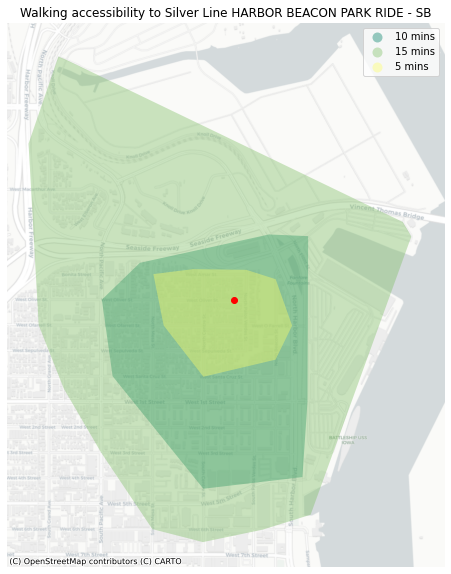

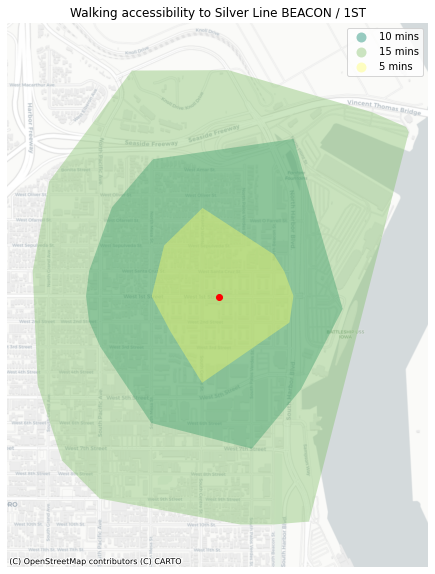

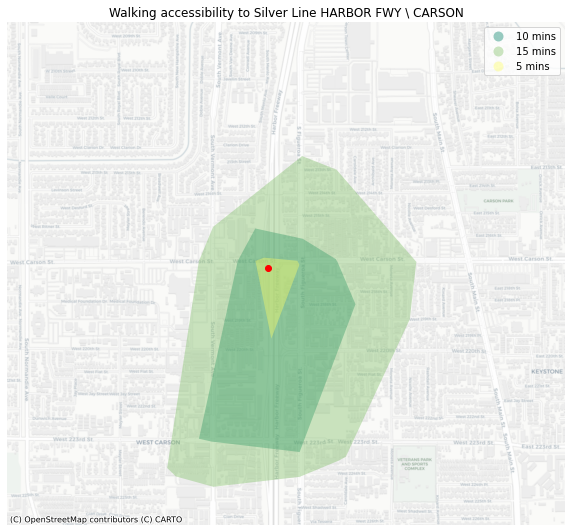

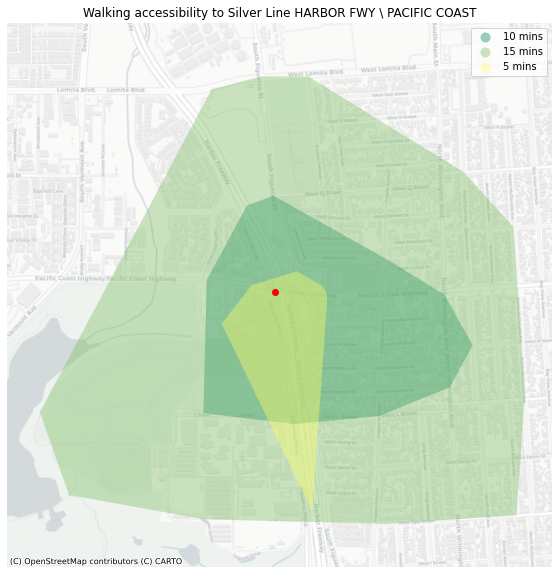

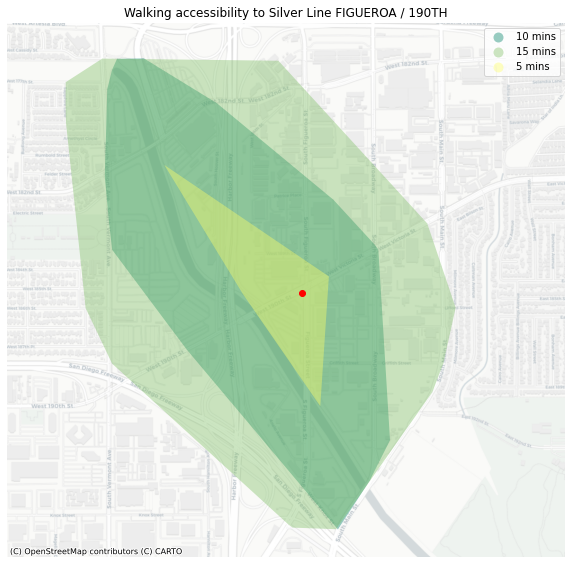

In [37]:
#run the function for all values in the list
#rename 'test' in both locations for your dataset, and the row numbers inside the for loop need to match the rows of your 'lat' and 'lon' columns
for index,row in test.iterrows():
    place = row[2], row[3] 
    isomap(test)